In [3]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np

# Load the Universal Sentence Encoder's TF Hub module
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

2024-04-23 16:06:36.796021: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [108]:
df = pd.read_csv("pyktok_output.csv")
suggested_words = df['suggested_words']
suggested_words_list = suggested_words.astype(str).tolist()
Embed = embed(suggested_words_list)
Embed.shape

TensorShape([1247, 512])

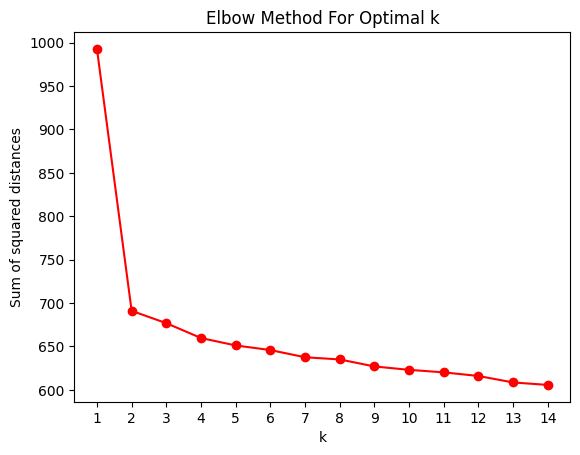

In [126]:
import matplotlib.pyplot as plt
def elbowMethod(embeddings, maxK):
    """
    Implements the Elbow method for finding most optimal k.
    It keeps track of a measure named "inertia" for each cluster.
    """
    sumSquaredDistances = []
    kValues = list(range(1, maxK))
    for k in kValues:
        km = KMeans(n_clusters=k, random_state=42)
        km = km.fit(embeddings)
        sumSquaredDistances.append(km.inertia_)
    
    # plot the line to identify the elbow
    plt.plot(kValues, sumSquaredDistances, 'ro-')
    plt.xlabel('k')
    plt.xticks(kValues)
    plt.ylabel('Sum of squared distances')
    plt.title('Elbow Method For Optimal k')
    plt.show()

elbowMethod(Embed, 15)

In [141]:
from sklearn.cluster import KMeans

# Assuming Embed is your embedding matrix and df is your DataFrame
k = 3  # number of clusters
kmeans = KMeans(n_clusters=k, random_state=42)
clusters = kmeans.fit_predict(Embed)

# Before splitting and assigning, ensure df is a standalone DataFrame

In [144]:
import pandas as pd
from sklearn.manifold import TSNE

# Run t-SNE for dimensionality reduction on the combined embeddings
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(Embed)

# Initialize the t-SNE DataFrame
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
df = df.reset_index(drop=True)
df2 = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
df2['description'] = df['suggested_words']
df2['cluster'] = clusters # the cluster indices where each news hashtags belong
df2


,tsne_1,tsne_2,description,cluster
0,7.193205,1.197858,"Loaded Fries, Fries, chicken fried, Loaded Fre...",2
1,-66.705070,56.270535,NaN,1
2,-24.262098,-11.993741,"pierson and brent, pierson, jackets, brentrive...",2
3,-61.436962,32.273754,NaN,1
4,-55.768734,-5.156044,NaN,1
...,...,...,...,...
1242,-73.060638,-3.917886,NaN,1
1243,2.879178,-18.968611,"katie sigmond, katie sigmond best pics, Golf S...",2
1244,8.864456,-8.727839,"scoliosis braces, ootd meaning, scoliosis outf...",0
1245,-6.209736,14.354604,"only one can comment, one person can comment, ...",2


In [145]:
import plotly.express as px

# Create the scatter plot
fig = px.scatter(df2, x='tsne_1', y='tsne_2', hover_data='description', color="cluster")

# Format what to show next to the markers
fig.update_traces(textposition='top center', 
                  mode='markers+text', 
                  textfont=dict(size=3))

fig.update_layout(title='Embeddings of recommended TikToks suggested_words')
fig.show()

In [134]:
df2 = pd.read_csv("categorize_bywords.csv")
category_words = df2['related_words']
topicEmbed = embed(category_words)
topicEmbed.shape

TensorShape([3, 512])

In [90]:
from sklearn.cluster import KMeans
k = 3 # number of clusters
kmeans = KMeans(n_clusters=k, random_state=42)
clusters = kmeans.fit_predict(embed_suggested_words)
for i in range(k):
    print(f"Cluster {i}:")
    #cluster_words = [embed_suggested_words[j] for j in range(len()) if clusters[j] == i]
    #print(cluster_words)

Cluster 0:
[<tf.Tensor: shape=(512,), dtype=float32, numpy=
array([-4.82064113e-02, -1.97244491e-02,  2.57703066e-02, -5.18988036e-02,
       -3.76401059e-02,  4.90644425e-02,  4.74132895e-02,  5.89768291e-02,
       -6.30485415e-02,  4.76368330e-02, -3.41501981e-02, -5.60468026e-02,
       -5.99381663e-02, -2.50118133e-02, -6.35554492e-02,  1.24993930e-02,
        4.80560511e-02,  5.37410006e-02, -4.48122015e-03, -6.17161840e-02,
        5.77730127e-02,  6.21032603e-02, -1.48652941e-02,  3.00278212e-03,
       -6.09859042e-02, -5.30471653e-02,  5.17246872e-02, -3.31423171e-02,
       -4.21228223e-02, -6.31748512e-02, -6.06417507e-02,  3.42184678e-02,
       -8.66214000e-03,  4.14635353e-02, -4.91845002e-03,  8.28139856e-03,
        3.79712619e-02, -6.08867556e-02,  1.33998357e-02, -2.85409316e-02,
       -4.89714742e-02,  1.52587825e-02,  6.35434091e-02, -3.45520489e-02,
       -6.07801005e-02, -6.18017949e-02,  4.70607094e-02,  3.73828560e-02,
       -6.33172840e-02, -6.31666929e-02,

In [94]:
import numpy as np
import pandas as pd
import tensorflow_hub as hub

# Load the Universal Sentence Encoder's TF Hub module
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

# Load suggested words
df = pd.read_csv("pyktok_output.csv")
# Drop rows with NaN values in the 'suggested_words' column
df = df.dropna(subset=['suggested_words'])
suggested_words = df['suggested_words'].astype(str).tolist()

# Embed the suggested words
embed_suggested_words = embed(suggested_words)

# Print the shape of the embeddings
print("Shape of embed_suggested_words:", embed_suggested_words.shape)

# Load category words
df2 = pd.read_csv("categorize_bywords.csv")
# Drop rows with NaN values in the 'related_words' column
df2 = df2.dropna(subset=['related_words'])
category_words = df2['related_words'].astype(str).tolist()

# Embed the category words
topicEmbed = embed(category_words)

# Print the shape of the embeddings
print("Shape of topicEmbed:", topicEmbed.shape)

from sklearn.cluster import KMeans

k = 15 # number of clusters
kmeans = KMeans(n_clusters=k, random_state=42)
clusters = kmeans.fit_predict(embed_suggested_words)

# Group suggested words by clusters
clustered_words = {}
for i in range(k):
    clustered_words[i] = []

for j, cluster_label in enumerate(clusters):
    clustered_words[cluster_label].append(suggested_words[j])

# Print the clustered words
for i in range(k):
    print(f"Cluster {i}:")
    print(clustered_words[i])


Shape of embed_suggested_words: (770, 512)
Shape of topicEmbed: (3, 512)
Cluster 0:
['nct wish, nct official, sakuya nct wish, ryo and sakuya, sakuya voice, nct, sakuryo, ryo nct wish', 'nct wish, nct official, wayv official, sion, ten nightwalker, NCT - Ten, riku nct wish, nct wish ten, ten predebut, Ten NCT Funny Moments', 'RIIZE, Mark Lee, nct wish, nct dream, love 119, wonbin, siren by riize, NCT 127, markno, love 119 sped up', 'Keeho, nct official, mark lee, P1Harmony, killin it p1harmony, nct, killin it dance tutorial, keeho p1harmony, NCT 127, keeho and mark', 'the boyz, younghoon the boyz, younghoon, taeyong, younghoon sullyoon, tap taeyong dance tutorial, younghoon edit, younghoon crying, NCT 127, taeyong lee', "who you foolin mark lee, mark lee, mark who you foolin, nct dream, who you foolin, NCT 127, who you foolin' lyrics, tell em mark lee, smoothie nct dream, who you foolin trend", 'Taeyong, nct dream, smoothie nct dream, Haechan, NCT 127, haechan mad at taeyong, Jaemin, S